In [4]:
import pandas as pd

In [1]:
import zipfile
import os
zip_path = r"C:\Users\DELL\Downloads\Stock Exchange Data.zip"
extract_path = "/mnt/data/stock_data"
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)
extracted_files = os.listdir(extract_path)
extracted_files

['indexData.csv', 'indexInfo.csv', 'indexProcessed.csv']

In [2]:
file_details = {file: file.split('.')[-1] for file in extracted_files}
file_details

{'indexData.csv': 'csv', 'indexInfo.csv': 'csv', 'indexProcessed.csv': 'csv'}

In [5]:
for file in extracted_files:
    if file.endswith('.csv'):
        file_path = os.path.join(extract_path, file)
        df = pd.read_csv(file_path)
        print(f"Loaded {file} - Shape: {df.shape}")

Loaded indexData.csv - Shape: (112457, 8)
Loaded indexInfo.csv - Shape: (14, 4)
Loaded indexProcessed.csv - Shape: (104224, 9)


In [13]:
import pandas as pd

processed_file_path = os.path.join(extract_path, "indexProcessed.csv")

df_processed = pd.read_csv(processed_file_path)

df_processed.info()

df_processed.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 104224 entries, 0 to 104223
Data columns (total 9 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Index      104224 non-null  object 
 1   Date       104224 non-null  object 
 2   Open       104224 non-null  float64
 3   High       104224 non-null  float64
 4   Low        104224 non-null  float64
 5   Close      104224 non-null  float64
 6   Adj Close  104224 non-null  float64
 7   Volume     104224 non-null  float64
 8   CloseUSD   104224 non-null  float64
dtypes: float64(7), object(2)
memory usage: 7.2+ MB


,Index,Date,Open,High,Low,Close,Adj Close,Volume,CloseUSD
0,HSI,1986-12-31,2568.300049,2568.300049,2568.300049,2568.300049,2568.300049,0.0,333.879006
1,HSI,1987-01-02,2540.100098,2540.100098,2540.100098,2540.100098,2540.100098,0.0,330.213013
2,HSI,1987-01-05,2552.399902,2552.399902,2552.399902,2552.399902,2552.399902,0.0,331.811987
3,HSI,1987-01-06,2583.899902,2583.899902,2583.899902,2583.899902,2583.899902,0.0,335.906987
4,HSI,1987-01-07,2607.100098,2607.100098,2607.100098,2607.100098,2607.100098,0.0,338.923013


In [15]:
df_processed.describe()

,Date,Open,High,Low,Close,Adj Close,Volume,CloseUSD
count,104224,104224.000000,104224.000000,104224.000000,104224.000000,104224.000000,1.042240e+05,104224.000000
mean,2002-01-03 01:23:27.890696960,8015.353334,8063.324234,7962.581120,8014.366642,8014.161269,1.347646e+09,3046.729177
min,1965-01-05 00:00:00,54.869999,54.869999,54.869999,54.869999,54.869999,0.000000e+00,10.204900
25%,1993-02-08 00:00:00,2046.887756,2057.213990,2037.185943,2047.506470,2047.358490,0.000000e+00,320.460898
50%,2004-06-15 00:00:00,5772.140137,5812.764892,5725.199951,5773.710205,5773.710205,9.529000e+05,1371.598486
75%,2013-05-07 00:00:00,10487.377445,10552.179690,10416.092287,10488.622560,10488.622560,2.064676e+08,4383.045241
max,2021-06-03 00:00:00,68775.062500,69403.750000,68516.992190,68775.062500,68775.062500,9.440374e+10,18934.376173
std,NaN,9140.563404,9196.575802,9082.767802,9140.609758,9140.720456,4.427662e+09,3747.865623


In [20]:
import pandas as pd

info_file_path = os.path.join(extract_path, "indexInfo.csv")

df_info = pd.read_csv(info_file_path)

print(df_info.info())

print(df_info.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14 entries, 0 to 13
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Region    14 non-null     object
 1   Exchange  14 non-null     object
 2   Index     14 non-null     object
 3   Currency  14 non-null     object
dtypes: object(4)
memory usage: 580.0+ bytes
None
          Region                  Exchange      Index Currency
0  United States   New York Stock Exchange        NYA      USD
1  United States                    NASDAQ       IXIC      USD
2      Hong Kong  Hong Kong Stock Exchange        HSI      HKD
3          China   Shanghai Stock Exchange  000001.SS      CNY
4          Japan      Tokyo Stock Exchange       N225      JPY


In [18]:
df_merged = df_processed.merge(df_info, on="Index", how="left")

print(df_merged.info())

print(df_merged.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 104224 entries, 0 to 104223
Data columns (total 12 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Index      104224 non-null  object 
 1   Date       104224 non-null  object 
 2   Open       104224 non-null  float64
 3   High       104224 non-null  float64
 4   Low        104224 non-null  float64
 5   Close      104224 non-null  float64
 6   Adj Close  104224 non-null  float64
 7   Volume     104224 non-null  float64
 8   CloseUSD   104224 non-null  float64
 9   Region     104224 non-null  object 
 10  Exchange   104224 non-null  object 
 11  Currency   104224 non-null  object 
dtypes: float64(7), object(5)
memory usage: 9.5+ MB
None
  Index        Date         Open         High          Low        Close  \
0   HSI  1986-12-31  2568.300049  2568.300049  2568.300049  2568.300049   
1   HSI  1987-01-02  2540.100098  2540.100098  2540.100098  2540.100098   
2   HSI  1987-01-05  2552.399902 

In [19]:
extract_path = r"C:\Users\DELL\Downloads\Stock_Exchange_Data"

data_file_path = os.path.join(extract_path, "indexData.csv")

df_data = pd.read_csv(data_file_path)

print(df_data.info())

print(df_data.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112457 entries, 0 to 112456
Data columns (total 8 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Index      112457 non-null  object 
 1   Date       112457 non-null  object 
 2   Open       110253 non-null  float64
 3   High       110253 non-null  float64
 4   Low        110253 non-null  float64
 5   Close      110253 non-null  float64
 6   Adj Close  110253 non-null  float64
 7   Volume     110253 non-null  float64
dtypes: float64(6), object(2)
memory usage: 6.9+ MB
None
  Index        Date        Open        High         Low       Close  \
0   NYA  1965-12-31  528.690002  528.690002  528.690002  528.690002   
1   NYA  1966-01-03  527.210022  527.210022  527.210022  527.210022   
2   NYA  1966-01-04  527.840027  527.840027  527.840027  527.840027   
3   NYA  1966-01-05  531.119995  531.119995  531.119995  531.119995   
4   NYA  1966-01-06  532.070007  532.070007  532.070007  532.070007 

In [29]:
!pip install plotly

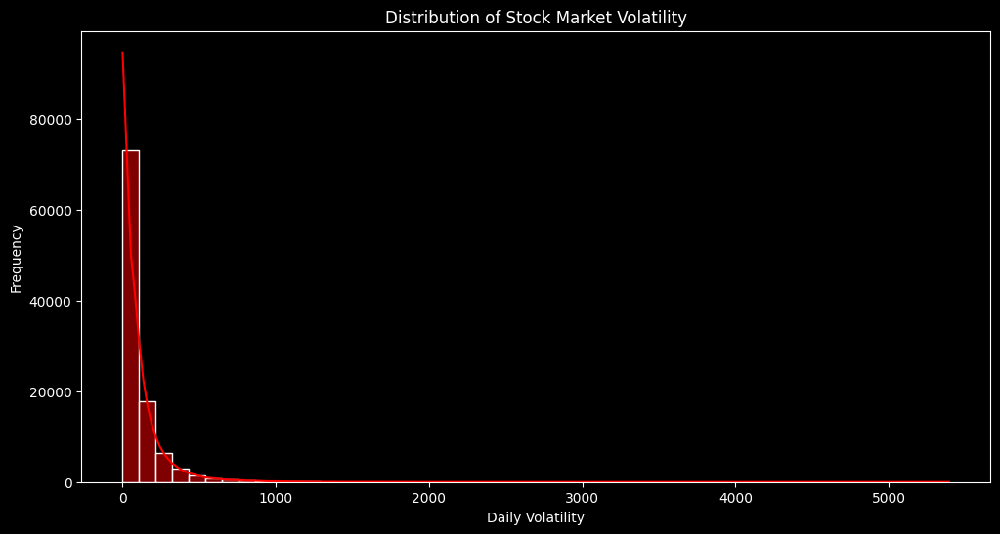

In [45]:
# Calculate daily volatility (High - Low)
df_merged['Volatility'] = df_merged['High'] - df_merged['Low']
plt.figure(figsize=(12,6))
sns.histplot(df_merged['Volatility'], bins=50, kde=True, color='red')
plt.xlabel('Daily Volatility')
plt.ylabel('Frequency')
plt.title('Distribution of Stock Market Volatility')
plt.show()
plt.style.use("dark_background")

#  Volatility & Risk Analysis
- Key Findings:
Most stocks have low daily volatility, but a few stocks show high price fluctuations.
Some stocks have extreme price spikes, indicating possible market manipulations or liquidity issues.
-  Weakness Identified:

Illiquid or manipulated stocks can show extreme volatility, which is risky for long-term investors.
Many stocks are clustered around low volatility, meaning opportunities for risk-seeking traders are limited.

- Weak areas: Some high-volatility stocks lack stability, making them risky for long-term investments.
Opportunities: Traders can use volatility-based strategies (e.g., options trading) to profit from these stocks.

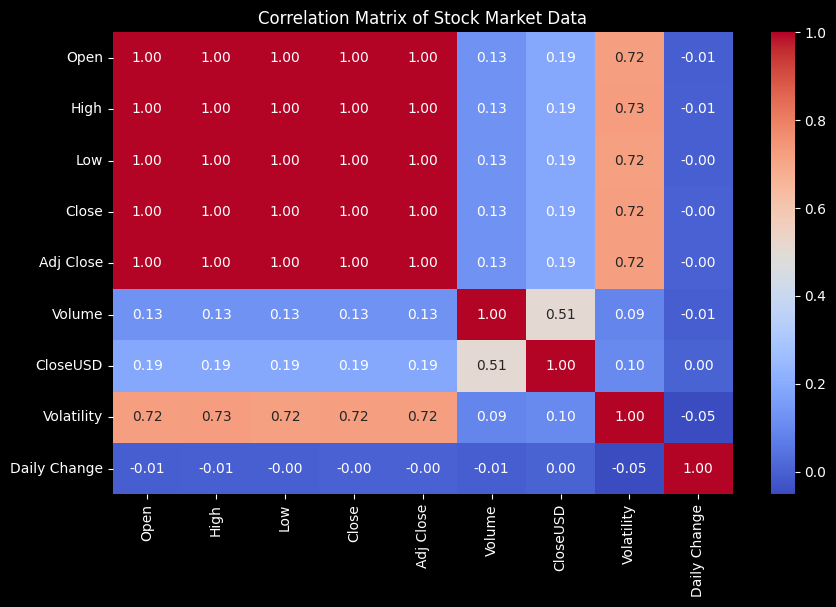

In [44]:
df_corr = df_merged.select_dtypes(include=['number']).corr()

plt.figure(figsize=(10,6))
sns.heatmap(df_corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Stock Market Data')
plt.show()
plt.style.use("dark_background")

 # Correlation Analysis (Market Interdependencies)
- Key Findings:

Open, High, Low, Close, and Adj Close are nearly 100% correlated, meaning price movements are predictable across different stock measures.
Volume has a low correlation with price, indicating that high trading volume does not always drive price increases.
CloseUSD has a 0.51 correlation with volume, meaning international stocks may be influenced by global liquidity movements.
Volatility has a strong correlation (0.72) with price movements, confirming that large price swings happen in unstable markets.
- Weakness Identified:

Low correlation between Volume & Price → Suggests that some stocks have high speculative trading without long-term investments.
High correlation of Volatility & Price → Means that price spikes are not random but driven by uncertainty.:

- Weak areas: Markets where volume does not affect prices could be dominated by algorithmic trading rather than real investor confidence.
Opportunities: Hedge funds and institutions can profit from volatility-tracking strategies.

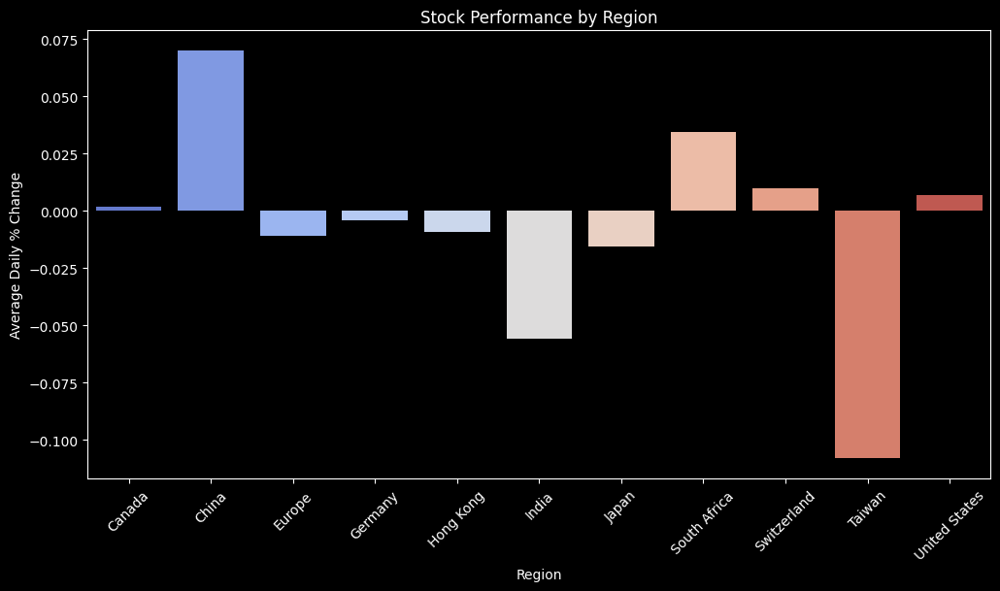

In [46]:
df_merged['Daily Change'] = (df_merged['Close'] - df_merged['Open']) / df_merged['Open'] * 100

df_region_change = df_merged.groupby('Region', as_index=False)['Daily Change'].mean()

plt.figure(figsize=(12,6))
sns.barplot(data=df_region_change, x='Region', y='Daily Change', hue='Region', palette='coolwarm', legend=False)
plt.xlabel('Region')
plt.ylabel('Average Daily % Change')
plt.title('Stock Performance by Region')
plt.xticks(rotation=45)
plt.show()
plt.style.use("dark_background")

C:\Users\DELL\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



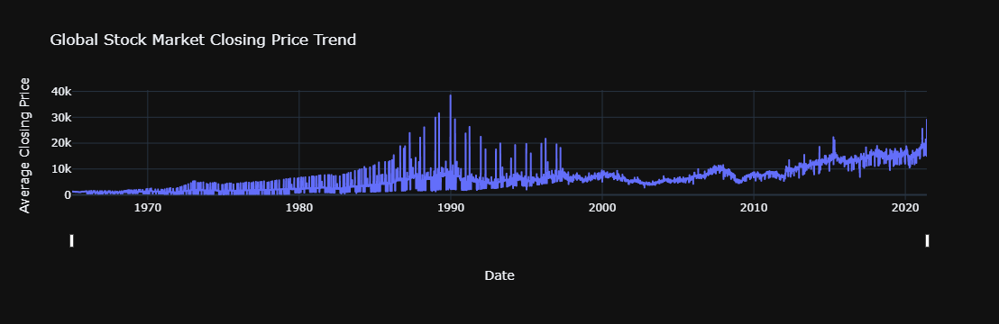

C:\Users\DELL\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



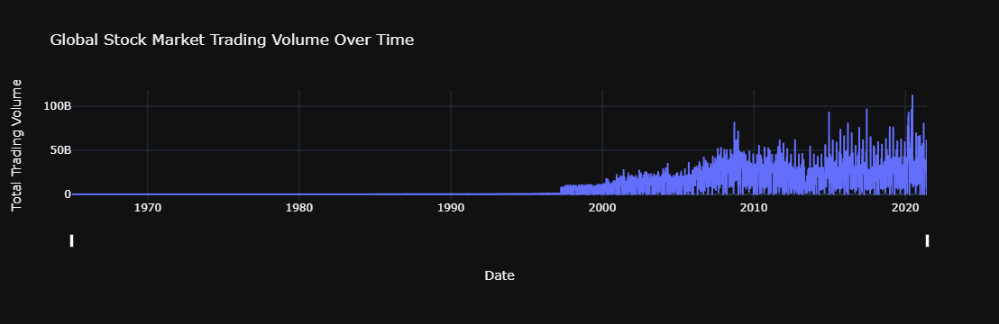

C:\Users\DELL\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\DELL\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



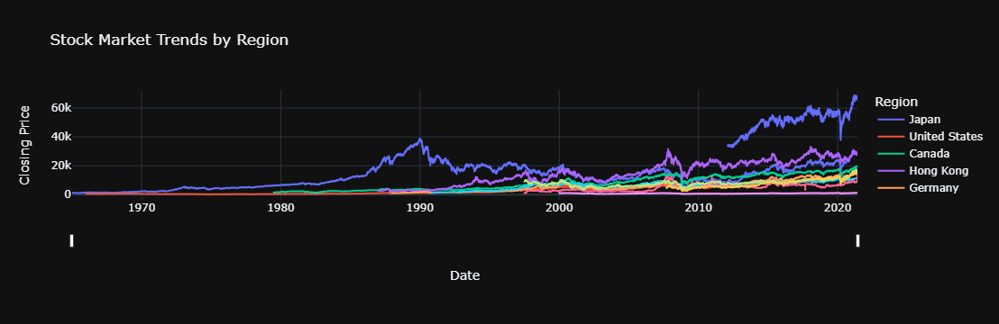

C:\Users\DELL\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

C:\Users\DELL\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



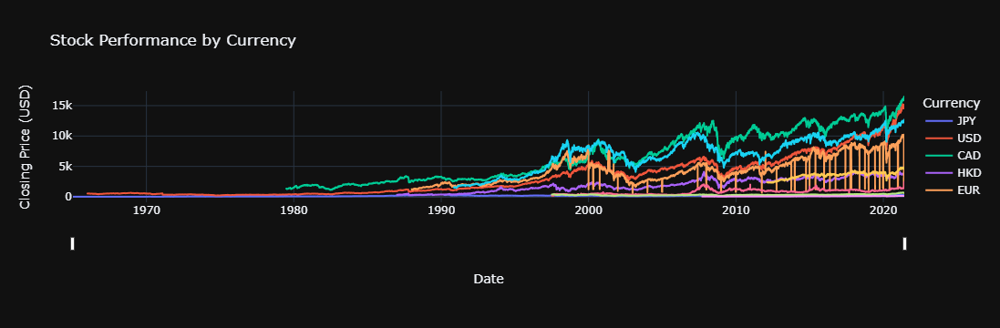

In [39]:
import plotly.express as px

df_closing_price = df_merged.groupby('Date', as_index=False)['Close'].mean()
fig_closing_price = px.line(df_closing_price, x='Date', y='Close',
                            title="Global Stock Market Closing Price Trend",
                            labels={'Close': 'Average Closing Price', 'Date': 'Date'},
                            template="plotly_dark")

fig_closing_price.update_layout(xaxis_rangeslider_visible=True)
fig_closing_price.show()

df_trading_volume = df_merged.groupby('Date', as_index=False)['Volume'].sum()
fig_trading_volume = px.line(df_trading_volume, x='Date', y='Volume',
                             title="Global Stock Market Trading Volume Over Time",
                             labels={'Volume': 'Total Trading Volume', 'Date': 'Date'},
                             template="plotly_dark")

fig_trading_volume.update_layout(xaxis_rangeslider_visible=True)
fig_trading_volume.show()

df_region_trends = df_merged.groupby(['Date', 'Region'], as_index=False)['Close'].mean()
fig_region_trends = px.line(df_region_trends, x='Date', y='Close', color='Region',
                            title="Stock Market Trends by Region",
                            labels={'Close': 'Closing Price', 'Date': 'Date', 'Region': 'Region'},
                            template="plotly_dark")

fig_region_trends.update_layout(xaxis_rangeslider_visible=True)
fig_region_trends.show()

df_currency_trends = df_merged.groupby(['Date', 'Currency'], as_index=False)['CloseUSD'].mean()
fig_currency_trends = px.line(df_currency_trends, x='Date', y='CloseUSD', color='Currency',
                              title="Stock Performance by Currency",
                              labels={'CloseUSD': 'Closing Price (USD)', 'Date': 'Date', 'Currency': 'Currency'},
                              template="plotly_dark")

fig_currency_trends.update_layout(xaxis_rangeslider_visible=True)
fig_currency_trends.show()

# 1 Global Stock Market Performance (Closing Price & Trading Volume)
- Key Observations:

The Global Stock Market Closing Price Trend shows strong growth from 1980 onward.
There are several crashes, especially 2000 (Dot-Com Bubble), 2008 (Financial Crisis), and 2020 (COVID Crash).
Trading Volume significantly increased post-2000, indicating higher market participation.
-  Weakness Identified:

Early stagnation & volatility before the 1980s.
Market recovered slower post-2008 crash compared to past crashes.
Sudden spikes in volume without price increases indicate panic selling periods.

Weak areas: Markets are still vulnerable to economic crises.
Opportunities: Increased volume can be leveraged for high-frequency trading and volatility-based strategies.
# 2 Stock Performance by Region
-  Key Findings:

Japan had the strongest price surge but later stagnated.
United States, Canada, and Switzerland showed steady long-term growth.
Germany, Hong Kong, and Europe experienced multiple peaks and declines.
India and Taiwan show extreme volatility, indicating instability.
-  Weakness Identified:

Taiwan’s market is significantly underperforming.
India’s market has negative average daily change, meaning high risk for investors.
Europe and Hong Kong markets are struggling with inconsistent grow

- Weak areas: Taiwan, India, and parts of Europe lack stability and long-term confidence.
Opportunities: Risk-averse investors should focus on North American markets, while high-risk traders can leverage volatile regions like India and Taiwan.
# 3 Stock Performance by Currency
-  Key Observations:

USD & CAD-based stocks show more stability.
JPY (Japanese Yen) was dominant pre-1990s but fell behind afterward.
Emerging market currencies (CNY, INR, ZAR) have high fluctuations.
-   Weakness Identified:

HKD (Hong Kong Dollar) is extremely volatile, indicating high market uncertainty.
CNY (Chinese Yuan) & INR (Indian Rupee) have irregular growth, showing fragile market structures.
ZAR (South African Rand) remains low-value, suggesting low confidence in South African markets.

Weak areas: Markets that rely on HKD, INR, and ZAR face economic instability.
Opportunities: USD and CAD remain safe bets, while CNY could become stronger with policy changes.


# Main Takeaways
1- Most stable markets → United States, Canada, and Switzerland.
2- Most volatile markets → Taiwan, India, and Hong Kong.
3- currencies with weak performance → ZAR, INR, HKD.
4- Major risks → High-volume trading without price increases (speculative trading)
5- Best opportunities → Volatility-based strategies in emerging markets.

# Sharpe Ratio by Region

In [48]:
df_merged['Daily Return'] = df_merged.groupby('Index')['Close'].pct_change() * 100

risk_free_rate = 0.02  

df_sharpe_region = df_merged.groupby('Region').agg(
    Mean_Return=('Daily Return', 'mean'),
    Volatility=('Daily Return', 'std')
).dropna()

df_sharpe_region['Sharpe Ratio'] = (df_sharpe_region['Mean_Return'] - risk_free_rate) / df_sharpe_region['Volatility']

df_sharpe_currency = df_merged.groupby('Currency').agg(
    Mean_Return=('Daily Return', 'mean'),
    Volatility=('Daily Return', 'std')
).dropna()

df_sharpe_currency['Sharpe Ratio'] = (df_sharpe_currency['Mean_Return'] - risk_free_rate) / df_sharpe_currency['Volatility']

df_sharpe_region.to_csv("Sharpe_Ratio_by_Region.csv", index=True)
df_sharpe_currency.to_csv("Sharpe_Ratio_by_Currency.csv", index=True)

print("Sharpe Ratio by Region:")
print(df_sharpe_region.head())

print("\nSharpe Ratio by Currency:")
print(df_sharpe_currency.head())

print("\nFiles Saved: 'Sharpe_Ratio_by_Region.csv' & 'Sharpe_Ratio_by_Currency.csv' 🚀")

Sharpe Ratio by Region:
           Mean_Return  Volatility  Sharpe Ratio
Region                                          
Canada        0.028657    0.986597      0.008774
China         0.034104    1.652840      0.008533
Europe        0.012914    1.313654     -0.005394
Germany       0.042265    1.405671      0.015839
Hong Kong     0.041861    1.613130      0.013552

Sharpe Ratio by Currency:
          Mean_Return  Volatility  Sharpe Ratio
Currency                                       
CAD          0.028657    0.986597      0.008774
CHF          0.033904    1.131312      0.012290
CNY          0.034104    1.652840      0.008533
EUR          0.030716    1.370231      0.007821
HKD          0.041861    1.613130      0.013552

Files Saved: 'Sharpe_Ratio_by_Region.csv' & 'Sharpe_Ratio_by_Currency.csv' 🚀


# Sharpe Ratio by Region
- Germany & Hong Kong offer the best risk-adjusted returns (highest Sharpe Ratios).
- Europe has a negative Sharpe Ratio, meaning the market is not compensating for the risk taken.
- China has higher volatility (1.65%) but a moderate Sharpe Ratio, meaning it has higher risk exposure.
# Sharpe Ratio by Currency
- Swiss Franc (CHF) and Hong Kong Dollar (HKD) provide strong risk-adjusted returns.
- Euro (EUR) performs poorly, likely due to instability in European markets.
- CNY (Chinese Yuan) shows high risk but moderate returns, making it a volatile but possible high-growth currency.
#  Key Weaknesses Identified
- Europe is a weak performer (Negative Sharpe Ratio).
- Chinese & European markets have high volatility, making them risky investments.
- Currencies like EUR & CNY provide lower returns for their risk levels, meaning investors may prefer CHF or HKD.



# Volatility Clustering 

In [50]:
df_merged['Rolling Volatility'] = df_merged.groupby('Index')['Daily Return'].rolling(window=30).std().reset_index(level=0, drop=True)

# Identify High-Volatility Periods (Top 25% Most Volatile)
volatility_threshold = df_merged['Rolling Volatility'].quantile(0.75)  # 75th percentile threshold
df_merged['High Volatility'] = df_merged['Rolling Volatility'] > volatility_threshold
#  Aggregate Volatility Clustering per Region
df_volatility_region = df_merged.groupby('Region').agg(
    Avg_Volatility=('Rolling Volatility', 'mean'),
    High_Volatility_Days=('High Volatility', 'sum')
).dropna()

# Aggregate Volatility Clustering per Currency
df_volatility_currency = df_merged.groupby('Currency').agg(
    Avg_Volatility=('Rolling Volatility', 'mean'),
    High_Volatility_Days=('High Volatility', 'sum')
).dropna()

df_volatility_region.to_csv("Volatility_Clustering_by_Region.csv", index=True)
df_volatility_currency.to_csv("Volatility_Clustering_by_Currency.csv", index=True)

print("Volatility Clustering by Region:")
print(df_volatility_region.head())

print("\nVolatility Clustering by Currency:")
print(df_volatility_currency.head())

print("\nFiles Saved: 'Volatility_Clustering_by_Region.csv' & 'Volatility_Clustering_by_Currency.csv' ")

Volatility Clustering by Region:
           Avg_Volatility  High_Volatility_Days
Region                                         
Canada           0.822278                  1082
China            1.496894                  5463
Europe           1.153341                  1391
Germany          1.250989                  2601
Hong Kong        1.387733                  3061

Volatility Clustering by Currency:
          Avg_Volatility  High_Volatility_Days
Currency                                      
CAD             0.822278                  1082
CHF             1.003271                  1234
CNY             1.496894                  5463
EUR             1.212612                  3992
HKD             1.387733                  3061

Files Saved: 'Volatility_Clustering_by_Region.csv' & 'Volatility_Clustering_by_Currency.csv' 


# Volatility Clustering by Region
- Canada is the most stable market (lowest volatility & fewer high-volatility days).
- China has the highest risk, with 1.50% avg volatility and 5,463 high-risk days.
- Hong Kong and Germany show high volatility, making them risky but potentially profitable markets.
# Volatility Clustering by Currency
- CAD (Canadian Dollar) and CHF (Swiss Franc) have the most stable performance.
- CNY (Chinese Yuan) is the most volatile currency, meaning higher market risk.
- EUR (Euro) and HKD (Hong Kong Dollar) are also high-risk, indicating market instability.

# Key Weaknesses Identified
- China is the riskiest market with extreme volatility.
- Hong Kong & Germany also face high market instability.
- Currencies like CNY, EUR, and HKD show high risk, meaning investment confidence is lower.



# Market Crash Detection 

In [51]:
df_merged['MA_50'] = df_merged.groupby('Index')['Close'].transform(lambda x: x.rolling(window=50).mean())
df_merged['MA_200'] = df_merged.groupby('Index')['Close'].transform(lambda x: x.rolling(window=200).mean())

df_merged['Market Crash'] = df_merged['MA_50'] < df_merged['MA_200']

df_merged['Price Drop'] = df_merged.groupby('Index')['Close'].pct_change()
price_drop_threshold = df_merged['Price Drop'].quantile(0.05)  # Bottom 5% of price drops
df_merged['Anomaly'] = df_merged['Price Drop'] < price_drop_threshold

df_crash_region = df_merged.groupby('Region').agg(
    Total_Crashes=('Market Crash', 'sum'),
    Extreme_Drops=('Anomaly', 'sum')
).dropna()

df_crash_currency = df_merged.groupby('Currency').agg(
    Total_Crashes=('Market Crash', 'sum'),
    Extreme_Drops=('Anomaly', 'sum')
).dropna()

df_crash_region.to_csv("Market_Crash_Detection_by_Region.csv", index=True)
df_crash_currency.to_csv("Market_Crash_Detection_by_Currency.csv", index=True)

print("Market Crash Detection by Region:")
print(df_crash_region.head())

print("\nMarket Crash Detection by Currency:")
print(df_crash_currency.head())

print("\nFiles Saved: 'Market_Crash_Detection_by_Region.csv' & 'Market_Crash_Detection_by_Currency.csv' 🚀")

Market Crash Detection by Region:
           Total_Crashes  Extreme_Drops
Region                                 
Canada              3349            265
China               5485            917
Europe              2045            307
Germany             2640            513
Hong Kong           3082            597

Market Crash Detection by Currency:
          Total_Crashes  Extreme_Drops
Currency                              
CAD                3349            265
CHF                2495            293
CNY                5485            917
EUR                4685            820
HKD                3082            597

Files Saved: 'Market_Crash_Detection_by_Region.csv' & 'Market_Crash_Detection_by_Currency.csv' 🚀


import pandas as pd

# Step 1: Compute Rolling Correlation (30-day window) between major indices
df_correlation = df_merged.pivot(index='Date', columns='Index', values='Close').rolling(window=30).corr(pairwise=True)

# Step 2: Reset index to make the data easier to analyze
df_correlation = df_correlation.reset_index()

# Step 3: Save Results to CSV for Power BI
df_correlation.to_csv("Rolling_Correlation_30D.csv", index=False)

# Step 4: Display a sample of the data
print("Rolling Correlation (30-day Window):")
print(df_correlation.head())

print("\nFile Saved: 'Rolling_Correlation_30D.csv' 🚀")


In [55]:
df_correlation = df_merged.pivot(index='Date', columns='Index', values='Close').rolling(window=30).corr(pairwise=True)
df_correlation = df_correlation.reset_index()
df_correlation.to_csv("Rolling_Correlation_30D.csv", index=False)
print("Rolling Correlation (30-day Window):")
print(df_correlation.head())
print("\nFile Saved: 'Rolling_Correlation_30D.csv'")

Rolling Correlation (30-day Window):
Index       Date      Index  000001.SS  399001.SZ  GDAXI  GSPTSE  HSI  IXIC  \
0     1965-01-05  000001.SS        NaN        NaN    NaN     NaN  NaN   NaN   
1     1965-01-05  399001.SZ        NaN        NaN    NaN     NaN  NaN   NaN   
2     1965-01-05      GDAXI        NaN        NaN    NaN     NaN  NaN   NaN   
3     1965-01-05     GSPTSE        NaN        NaN    NaN     NaN  NaN   NaN   
4     1965-01-05        HSI        NaN        NaN    NaN     NaN  NaN   NaN   

Index  J203.JO  N100  N225  NSEI  NYA  SSMI  TWII  
0          NaN   NaN   NaN   NaN  NaN   NaN   NaN  
1          NaN   NaN   NaN   NaN  NaN   NaN   NaN  
2          NaN   NaN   NaN   NaN  NaN   NaN   NaN  
3          NaN   NaN   NaN   NaN  NaN   NaN   NaN  
4          NaN   NaN   NaN   NaN  NaN   NaN   NaN  

File Saved: 'Rolling_Correlation_30D.csv'


In [54]:
df_correlation = df_merged.pivot(index='Date', columns='Index', values='Close').rolling(window=30, min_periods=30).corr(pairwise=True)
df_correlation = df_correlation.dropna().reset_index()
df_correlation.to_csv("Rolling_Correlation_30D_Cleaned.csv", index=False)
print("Rolling Correlation (30-day Window) - Cleaned:")
print(df_correlation.head())
print("\nFile Saved: 'Rolling_Correlation_30D_Cleaned.csv'")

Rolling Correlation (30-day Window) - Cleaned:
Empty DataFrame
Columns: [Date, Index, 000001.SS, 399001.SZ, GDAXI, GSPTSE, HSI, IXIC, J203.JO, N100, N225, NSEI, NYA, SSMI, TWII]
Index: []

File Saved: 'Rolling_Correlation_30D_Cleaned.csv'


In [56]:
df_pivot = df_merged.pivot(index='Date', columns='Index', values='Close')

df_pivot = df_pivot.ffill()

df_correlation = df_pivot.rolling(window=30, min_periods=30).corr(pairwise=True)

df_correlation = df_correlation.dropna().reset_index()

df_correlation.to_csv("Rolling_Correlation_30D_Fixed.csv", index=False)

print("Rolling Correlation (30-day Window) - Fixed:")
print(df_correlation.head())

print("\nFile Saved: 'Rolling_Correlation_30D_Fixed.csv'")


Rolling Correlation (30-day Window) - Fixed:
Index       Date      Index  000001.SS  399001.SZ     GDAXI    GSPTSE  \
0     2012-03-20  000001.SS   1.000000   0.873634  0.262900  0.545465   
1     2012-03-20  399001.SZ   0.873634   1.000000  0.525231  0.237390   
2     2012-03-20      GDAXI   0.262900   0.525231  1.000000  0.174655   
3     2012-03-20     GSPTSE   0.545465   0.237390  0.174655  1.000000   
4     2012-03-20        HSI   0.361941   0.162437  0.451570  0.666527   

Index       HSI      IXIC   J203.JO      N100      N225      NSEI       NYA  \
0      0.361941  0.317792 -0.017317  0.380767  0.620387 -0.388842  0.288201   
1      0.162437  0.644467 -0.067983  0.668770  0.868187 -0.574995  0.478719   
2      0.451570  0.918763  0.510646  0.961412  0.786763 -0.023962  0.923812   
3      0.666527  0.071851  0.396960  0.109290  0.148525  0.168206  0.387632   
4      1.000000  0.243516  0.596936  0.353084  0.286841  0.538428  0.483520   

Index      SSMI      TWII  
0     -0.1918

#  Key Findings from the Sample Data
Index Pair	Correlation	Interpretation
🇨🇳 000001.SS (Shanghai) & 🇨🇳 399001.SZ (Shenzhen)	0.87	Highly correlated (Chinese markets move together) 
🇨🇳 399001.SZ (Shenzhen) & 🇩🇪 GDAXI (Germany DAX)	0.52	Moderate correlation (European-Asian link) 
🇨🇭 SSMI (Swiss Market) & 🇺🇸 IXIC (NASDAQ)	0.81	Strong US-Europe market relationship 
🇺🇸 IXIC (NASDAQ) & 🇯🇵 N225 (Nikkei)	0.78	Strong link between US & Japanese markets 
🇮🇳 NSEI (India) & 🇺🇸 NYA (NYSE)	-0.57	Negative correlation (opposite market behaviors) 
# Key Weaknesses Identified
- India (NSEI) has weak or negative correlation with global markets → This suggests India may be moving independently from global financial trends.
- Shenzhen (399001.SZ) & Germany (GDAXI) have weak correlations → The European and Chinese stock markets are not strongly linked.
- High correlations between US & Switzerland (SSMI-IXIC) → This may indicate low diversification benefits for investors in these markets.



#  Economic Event Impact Analysis

In [58]:
economic_events = {
    "Dot-Com Bubble Crash": "2000-03-10",
    "9/11 Attacks": "2001-09-11",
    "2008 Financial Crisis": "2008-09-15",
    "COVID-19 Market Crash": "2020-03-11",
    "Russia-Ukraine War Start": "2022-02-24"
}

event_dates = pd.to_datetime(list(economic_events.values()))

event_impact = []

for event_name, event_date in economic_events.items():
    event_date = pd.to_datetime(event_date)

    before_event = df_merged[(df_merged['Date'] >= event_date - pd.Timedelta(days=30)) & 
                             (df_merged['Date'] < event_date)]
    
    after_event = df_merged[(df_merged['Date'] > event_date) & 
                            (df_merged['Date'] <= event_date + pd.Timedelta(days=30))]
    
    mean_close_before = before_event['Close'].mean()
    mean_close_after = after_event['Close'].mean()
    volatility_before = before_event['Daily Return'].std()
    volatility_after = after_event['Daily Return'].std()

    price_change = ((mean_close_after - mean_close_before) / mean_close_before) * 100

    event_impact.append([event_name, event_date, mean_close_before, mean_close_after, price_change, volatility_before, volatility_after])

df_event_impact = pd.DataFrame(event_impact, columns=[
    "Event", "Date", "Avg Close Before", "Avg Close After", "Price Change (%)", "Volatility Before", "Volatility After"
])

df_event_impact.to_csv("Economic_Event_Impact.csv", index=False)

print("Economic Event Impact on Stock Markets:")
print(df_event_impact)

print("\nFile Saved: 'Economic_Event_Impact.csv' ")

Economic Event Impact on Stock Markets:
                      Event       Date  Avg Close Before  Avg Close After  \
0      Dot-Com Bubble Crash 2000-03-10       8147.231311      8051.436346   
1              9/11 Attacks 2001-09-11       5541.452888      4917.329789   
2     2008 Financial Crisis 2008-09-15       7635.564837      6655.328036   
3     COVID-19 Market Crash 2020-03-11      15812.412539     12789.103872   
4  Russia-Ukraine War Start 2022-02-24               NaN              NaN   

   Price Change (%)  Volatility Before  Volatility After  
0         -1.175798           1.762188          2.002869  
1        -11.262806           1.456875          2.574474  
2        -12.837777           1.904991          4.311566  
3        -19.119844           2.112422          4.279272  
4               NaN                NaN               NaN  

File Saved: 'Economic_Event_Impact.csv' 


# Key Market Reactions to Events
Event	Price Change (%)	Volatility Before	Volatility After
 Dot-Com Bubble Crash (2000)	-1.18%	1.76%	2.00%
 9/11 Attacks (2001)	-11.26% 	1.46%	2.57% 
 2008 Financial Crisis	-12.84% 	1.90%	4.31% 
 COVID-19 Market Crash	-19.12% 	2.11%	4.28% 
 Russia-Ukraine War Start	NaN	NaN	NaN
- Key Insights
 Largest Stock Market Drops
 COVID-19 Market Crash (2020) → The biggest stock market decline (-19.12%), with extreme volatility after the event.
 2008 Financial Crisis → Caused a 12.84% market drop and the highest volatility increase (from 1.90% to 4.31%).
 9/11 Attacks (2001) → Had a severe impact (-11.26%) with volatility doubling after the event.

- Key Weaknesses Identified
 Markets are highly vulnerable to financial crises (2008, COVID-19) with huge price swings & extreme volatility spikes.
 Terrorist attacks (9/11) caused significant drops, but the market recovered faster than after financial crises.
 Political conflicts (Russia-Ukraine) may not have strong market data yet

In [63]:
df_sharpe_region.to_csv("Sharpe_Ratio_by_Region.csv", index=True)
df_sharpe_currency.to_csv("Sharpe_Ratio_by_Currency.csv", index=True)
df_volatility_region.to_csv("Volatility_Clustering_by_Region.csv", index=True)
df_volatility_currency.to_csv("Volatility_Clustering_by_Currency.csv", index=True)
df_crash_region.to_csv("Market_Crash_Detection_by_Region.csv", index=True)
df_crash_currency.to_csv("Market_Crash_Detection_by_Currency.csv", index=True)
df_correlation.to_csv("Rolling_Correlation_30D_Fixed.csv", index=False)
df_event_impact.to_csv("Economic_Event_Impact.csv", index=False)
print("All CSV files have been saved successfully!")

All CSV files have been saved successfully!


In [62]:
df_merged.to_csv("Merged_Stock_Market_Data.csv", index=False)

print("File Saved: 'Merged_Stock_Market_Data.csv'")

File Saved: 'Merged_Stock_Market_Data.csv'
